In [1]:
!unzip '/content/drive/MyDrive/Data/PlantTraits/planttraits2024.zip'

Streaming output truncated to the last 5000 lines.
  inflating: train_images/196423534.jpeg  
  inflating: train_images/196423707.jpeg  
  inflating: train_images/196423993.jpeg  
  inflating: train_images/196424200.jpeg  
  inflating: train_images/196424210.jpeg  
  inflating: train_images/196424213.jpeg  
  inflating: train_images/196424291.jpeg  
  inflating: train_images/196424430.jpeg  
  inflating: train_images/196424593.jpeg  
  inflating: train_images/196424666.jpeg  
  inflating: train_images/196424802.jpeg  
  inflating: train_images/196424812.jpeg  
  inflating: train_images/196424938.jpeg  
  inflating: train_images/196425178.jpeg  
  inflating: train_images/196425491.jpeg  
  inflating: train_images/196425781.jpeg  
  inflating: train_images/196426308.jpeg  
  inflating: train_images/196426979.jpeg  
  inflating: train_images/196427019.jpeg  
  inflating: train_images/196427071.jpeg  
  inflating: train_images/196427085.jpeg  
  inflating: train_images/196427243.jpeg  
  i

In [2]:
!pip install torch torchvision pandas scikit-learn matplotlib


In [3]:
import os
import pandas as pd
import numpy as np
import torch
import torchvision
import torch.nn as nn
import torch.optim as optim
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from torchvision import models, transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import matplotlib.pyplot as plt

In [4]:
train_df = pd.read_csv('train.csv')
train_df.head()

,id,WORLDCLIM_BIO1_annual_mean_temperature,WORLDCLIM_BIO12_annual_precipitation,WORLDCLIM_BIO13.BIO14_delta_precipitation_of_wettest_and_dryest_month,WORLDCLIM_BIO15_precipitation_seasonality,WORLDCLIM_BIO4_temperature_seasonality,WORLDCLIM_BIO7_temperature_annual_range,SOIL_bdod_0.5cm_mean_0.01_deg,SOIL_bdod_100.200cm_mean_0.01_deg,SOIL_bdod_15.30cm_mean_0.01_deg,...,X18_mean,X26_mean,X50_mean,X3112_mean,X4_sd,X11_sd,X18_sd,X26_sd,X50_sd,X3112_sd
0,192027691,12.235703,374.466675,62.524445,72.256844,773.592041,33.277779,125,149,136,...,0.117484,1.243779,1.849375,50.216034,0.008921,1.601473,0.025441,0.153608,0.279610,15.045054
1,195542235,17.270555,90.239998,10.351111,38.220940,859.193298,40.009777,124,144,138,...,0.389315,0.642940,1.353468,574.098472,0.003102,0.258078,0.000866,0.034630,0.010165,11.004477
2,196639184,14.254504,902.071411,49.642857,17.873655,387.977753,22.807142,107,133,119,...,8.552908,0.395241,2.343153,1130.096731,NaN,NaN,NaN,NaN,NaN,NaN
3,195728812,18.680834,1473.933350,163.100006,45.009758,381.053986,20.436666,120,131,125,...,1.083629,0.154200,1.155308,1042.686546,0.011692,2.818356,0.110673,0.011334,0.229224,141.857187
4,195251545,0.673204,530.088867,50.857777,38.230709,1323.526855,45.891998,91,146,120,...,0.657585,10.919966,2.246226,2386.467180,0.006157,1.128000,0.026996,0.553815,0.107092,87.146899


In [5]:
train_df.describe()

,id,WORLDCLIM_BIO1_annual_mean_temperature,WORLDCLIM_BIO12_annual_precipitation,WORLDCLIM_BIO13.BIO14_delta_precipitation_of_wettest_and_dryest_month,WORLDCLIM_BIO15_precipitation_seasonality,WORLDCLIM_BIO4_temperature_seasonality,WORLDCLIM_BIO7_temperature_annual_range,SOIL_bdod_0.5cm_mean_0.01_deg,SOIL_bdod_100.200cm_mean_0.01_deg,SOIL_bdod_15.30cm_mean_0.01_deg,...,X18_mean,X26_mean,X50_mean,X3112_mean,X4_sd,X11_sd,X18_sd,X26_sd,X50_sd,X3112_sd
count,5.548900e+04,55489.000000,55489.000000,55489.000000,55489.000000,55489.000000,55489.000000,55489.000000,55489.000000,55489.000000,...,5.548900e+04,5.548900e+04,55489.000000,5.548900e+04,39148.000000,39148.000000,39148.000000,39148.000000,39148.000000,39148.000000
mean,1.714553e+08,14.577142,1058.710939,138.164359,56.727213,518.711405,25.227185,116.895673,140.259205,128.187695,...,1.969902e+04,3.459399e+03,13.528574,3.975552e+05,0.007833,1.073573,16.003476,110.733150,0.075108,453.017146
std,4.087868e+07,7.584290,768.992166,136.409312,31.692061,316.618440,9.151237,17.607857,15.075214,16.030602,...,2.309747e+06,2.471919e+05,1356.480785,9.152463e+07,0.012046,4.098486,881.605417,8361.855750,0.159520,4196.228211
min,2.637500e+04,-13.731130,0.000000,0.000000,0.000000,9.877081,7.658674,29.000000,46.000000,42.000000,...,2.330000e-08,5.500000e-07,0.000097,7.690000e-08,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.658614e+08,9.247916,528.315552,53.000000,29.685472,300.478760,18.800001,106.000000,131.000000,118.000000,...,3.102831e-01,5.613414e-01,1.173489,2.552815e+02,0.003292,0.174866,0.029985,0.042226,0.017207,17.259899
50%,1.915103e+08,15.536692,853.776184,95.500000,50.196312,446.522308,23.681778,118.000000,142.000000,129.000000,...,7.156651e-01,2.519985e+00,1.480060,7.244318e+02,0.004996,0.357821,0.095136,0.238664,0.033162,63.322952
75%,1.951001e+08,20.238457,1352.000000,181.485718,80.811249,690.003845,30.399998,130.000000,150.000000,139.000000,...,3.586311e+00,1.491886e+01,1.926343,2.148630e+03,0.007774,1.092862,0.330147,1.516574,0.082851,226.990400
max,1.967668e+08,30.294445,8392.463867,2448.964355,169.582291,2025.894653,63.657616,194.000000,192.000000,201.000000,...,2.720494e+08,3.106555e+07,159759.897700,2.155911e+10,0.284052,515.672017,63535.386846,739701.798818,9.729029,387491.201058


In [6]:
print(train_df.columns)

Index(['id', 'WORLDCLIM_BIO1_annual_mean_temperature',
       'WORLDCLIM_BIO12_annual_precipitation',
       'WORLDCLIM_BIO13.BIO14_delta_precipitation_of_wettest_and_dryest_month',
       'WORLDCLIM_BIO15_precipitation_seasonality',
       'WORLDCLIM_BIO4_temperature_seasonality',
       'WORLDCLIM_BIO7_temperature_annual_range',
       'SOIL_bdod_0.5cm_mean_0.01_deg', 'SOIL_bdod_100.200cm_mean_0.01_deg',
       'SOIL_bdod_15.30cm_mean_0.01_deg',
       ...
       'X18_mean', 'X26_mean', 'X50_mean', 'X3112_mean', 'X4_sd', 'X11_sd',
       'X18_sd', 'X26_sd', 'X50_sd', 'X3112_sd'],
      dtype='object', length=176)


In [7]:
len(train_df)

55489

In [8]:
import pandas as pd

# Load the CSV with trait IDs and names (for target columns)
trait_df = pd.read_csv('/content/target_name_meta.tsv',  sep='\t')  # Assuming traits.csv contains 'trait_ID' and 'trait_name' columns
target_columns_base = trait_df['trait_ID'].tolist()  # List of base target column names from the CSV

# Identify all columns in train_df
all_columns = train_df.columns

# Initialize lists for actual target columns (with _mean or _sd) and feature columns (X)
target_columns = []
features_columns = []

# Iterate through all columns to classify them as target or feature
for col in all_columns:
    # Check if the column corresponds to a trait with either _mean or _sd suffix
    if any(col == f"{base}_mean" or col == f"{base}_sd" for base in target_columns_base):
        target_columns.append(col)
    else:
        features_columns.append(col)

# Print the identified columns for verification
print("Features columns (X):", features_columns)
print("Target columns:", target_columns)


Features columns (X): ['id', 'WORLDCLIM_BIO1_annual_mean_temperature', 'WORLDCLIM_BIO12_annual_precipitation', 'WORLDCLIM_BIO13.BIO14_delta_precipitation_of_wettest_and_dryest_month', 'WORLDCLIM_BIO15_precipitation_seasonality', 'WORLDCLIM_BIO4_temperature_seasonality', 'WORLDCLIM_BIO7_temperature_annual_range', 'SOIL_bdod_0.5cm_mean_0.01_deg', 'SOIL_bdod_100.200cm_mean_0.01_deg', 'SOIL_bdod_15.30cm_mean_0.01_deg', 'SOIL_bdod_30.60cm_mean_0.01_deg', 'SOIL_bdod_5.15cm_mean_0.01_deg', 'SOIL_bdod_60.100cm_mean_0.01_deg', 'SOIL_cec_0.5cm_mean_0.01_deg', 'SOIL_cec_100.200cm_mean_0.01_deg', 'SOIL_cec_15.30cm_mean_0.01_deg', 'SOIL_cec_30.60cm_mean_0.01_deg', 'SOIL_cec_5.15cm_mean_0.01_deg', 'SOIL_cec_60.100cm_mean_0.01_deg', 'SOIL_cfvo_0.5cm_mean_0.01_deg', 'SOIL_cfvo_100.200cm_mean_0.01_deg', 'SOIL_cfvo_15.30cm_mean_0.01_deg', 'SOIL_cfvo_30.60cm_mean_0.01_deg', 'SOIL_cfvo_5.15cm_mean_0.01_deg', 'SOIL_cfvo_60.100cm_mean_0.01_deg', 'SOIL_clay_0.5cm_mean_0.01_deg', 'SOIL_clay_100.200cm_mean_0.0

In [9]:
import pandas as pd

# Check for missing values in train.csv
print("Missing values in train.csv:")
print(train_df[target_columns].isnull().sum())

Missing values in train.csv:
X4_mean           0
X11_mean          0
X18_mean          0
X26_mean          0
X50_mean          0
X3112_mean        0
X4_sd         16341
X11_sd        16341
X18_sd        16341
X26_sd        16341
X50_sd        16341
X3112_sd      16341
dtype: int64


In [10]:
# Drop rows with missing values
train_df = train_df.dropna(subset=['X4_sd', 'X11_sd', 'X18_sd', 'X26_sd', 'X50_sd', 'X3112_sd'])

In [11]:
X_df = train_df[features_columns]

In [12]:
len(features_columns)

164

In [13]:
X_df.head()

,id,WORLDCLIM_BIO1_annual_mean_temperature,WORLDCLIM_BIO12_annual_precipitation,WORLDCLIM_BIO13.BIO14_delta_precipitation_of_wettest_and_dryest_month,WORLDCLIM_BIO15_precipitation_seasonality,WORLDCLIM_BIO4_temperature_seasonality,WORLDCLIM_BIO7_temperature_annual_range,SOIL_bdod_0.5cm_mean_0.01_deg,SOIL_bdod_100.200cm_mean_0.01_deg,SOIL_bdod_15.30cm_mean_0.01_deg,...,VOD_X_1997_2018_multiyear_mean_m03,VOD_X_1997_2018_multiyear_mean_m04,VOD_X_1997_2018_multiyear_mean_m05,VOD_X_1997_2018_multiyear_mean_m06,VOD_X_1997_2018_multiyear_mean_m07,VOD_X_1997_2018_multiyear_mean_m08,VOD_X_1997_2018_multiyear_mean_m09,VOD_X_1997_2018_multiyear_mean_m10,VOD_X_1997_2018_multiyear_mean_m11,VOD_X_1997_2018_multiyear_mean_m12
0,192027691,12.235703,374.466675,62.524445,72.256844,773.592041,33.277779,125,149,136,...,0.455806,0.506616,0.531718,0.509142,0.444842,0.423471,0.444432,0.472432,0.448272,0.403038
1,195542235,17.270555,90.239998,10.351111,38.220940,859.193298,40.009777,124,144,138,...,0.277699,0.270621,0.264534,0.244796,0.253600,0.251986,0.261273,0.279112,0.294724,0.311158
3,195728812,18.680834,1473.933350,163.100006,45.009758,381.053986,20.436666,120,131,125,...,0.334322,0.328369,0.316033,0.305631,0.321647,0.329818,0.318389,0.350208,0.349995,0.348838
4,195251545,0.673204,530.088867,50.857777,38.230709,1323.526855,45.891998,91,146,120,...,0.358661,0.419538,0.466089,0.562763,0.608216,0.610752,0.565290,0.488996,0.457526,0.448166
5,195733955,12.062123,1982.033325,320.138092,74.343796,318.258270,17.557619,101,142,120,...,0.347074,0.353948,0.356893,0.363198,0.365891,0.370114,0.366723,0.361768,0.359128,0.351619


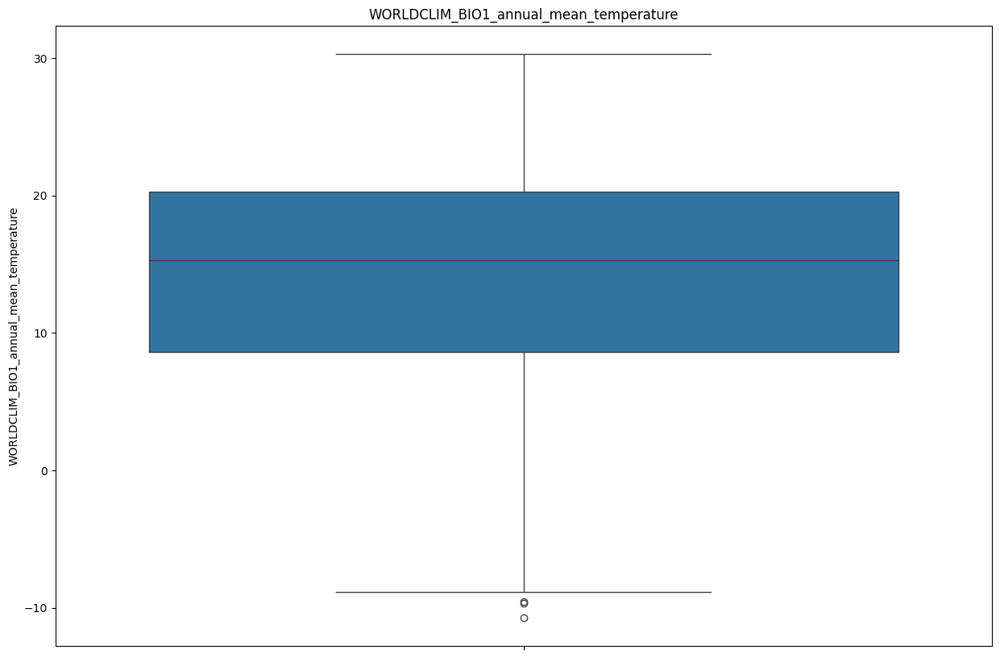

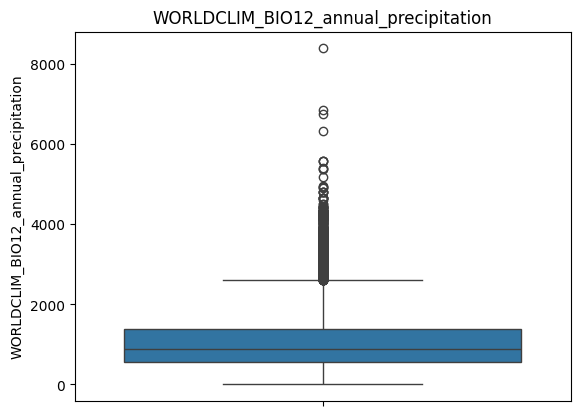

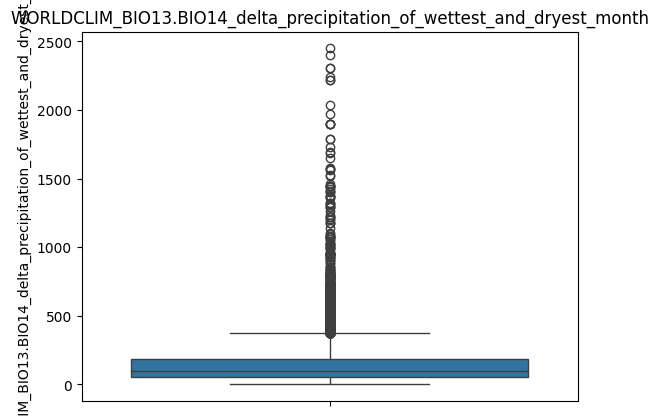

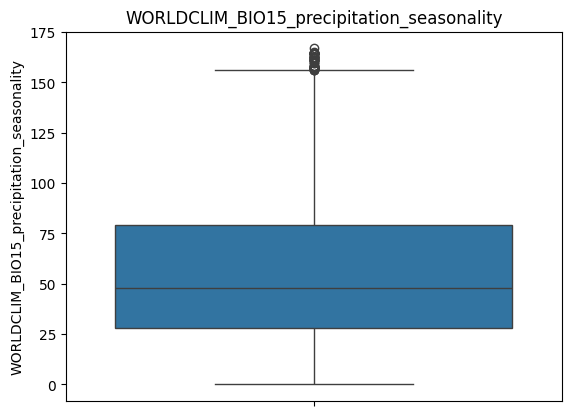

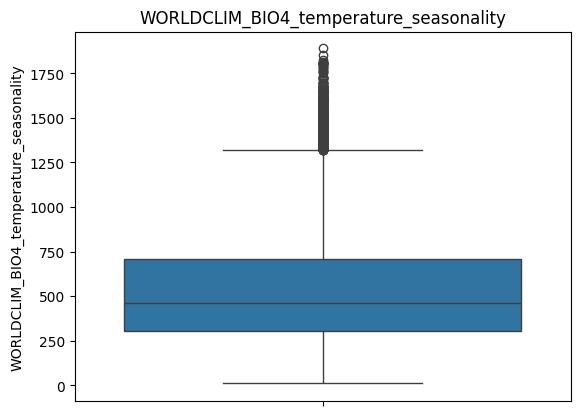

...

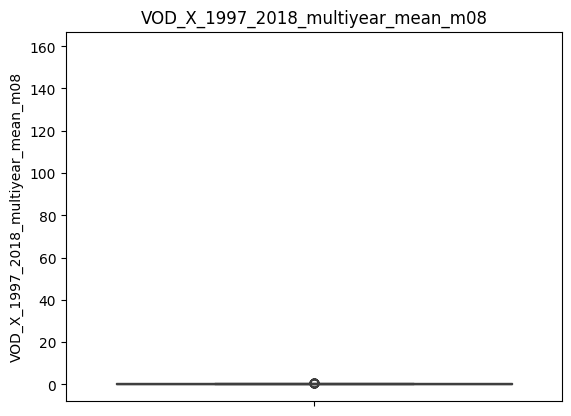

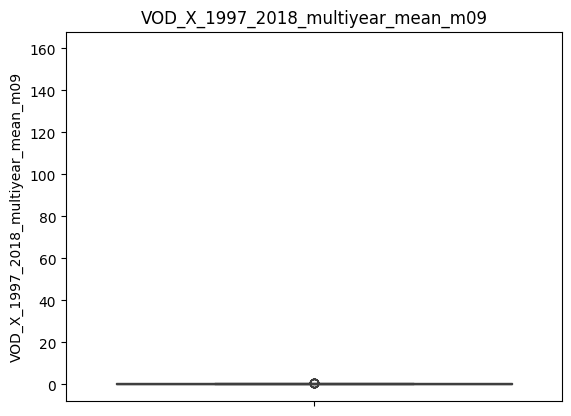

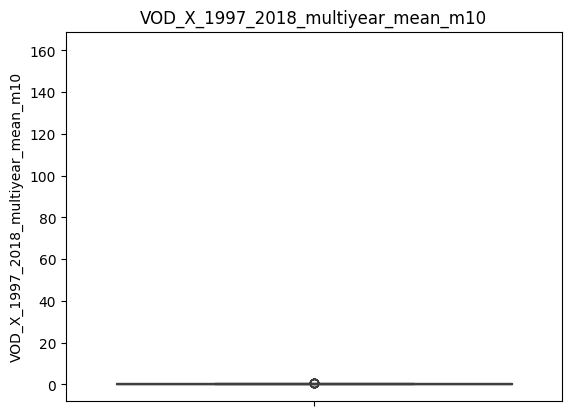

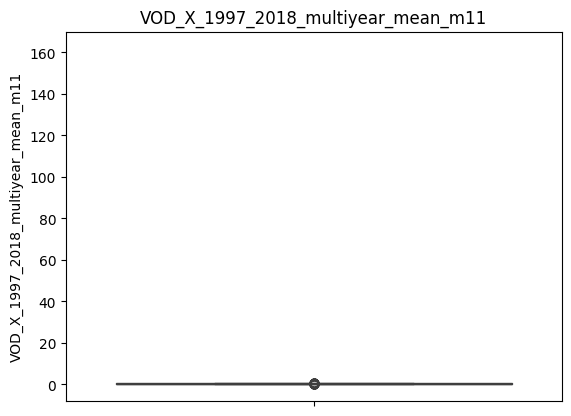

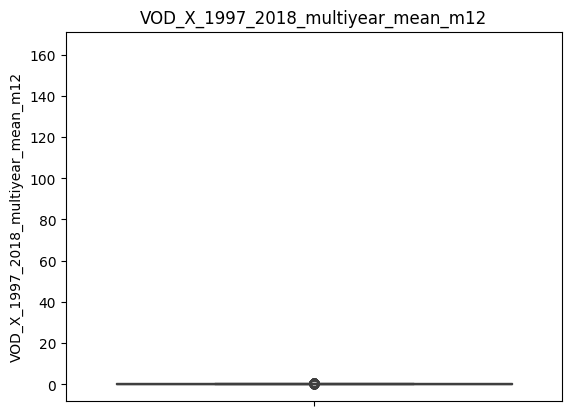

In [14]:
import math
import matplotlib.pyplot as plt
import seaborn as sns

# Loop through all the numeric columns to create boxplots
# Select numeric columns and exclude 'id'
numeric_columns = X_df.select_dtypes(include=['float64', 'int64']).columns
numeric_columns = numeric_columns[numeric_columns != 'id']



plt.figure(figsize=(15, 10))
for i, col in enumerate(numeric_columns, 1):
    plt.plot(i)
    sns.boxplot(train_df[col])
    plt.title(col)

    plt.show()


In [15]:
from scipy import stats
import numpy as np

# Calculate Z-scores
z_scores = np.abs(stats.zscore(X_df[numeric_columns]))

# Get the rows that have outliers in any column
outliers = X_df[(z_scores > 3).any(axis=1)]
print(f"Number of rows with outliers: {len(outliers)}")


Number of rows with outliers: 8312


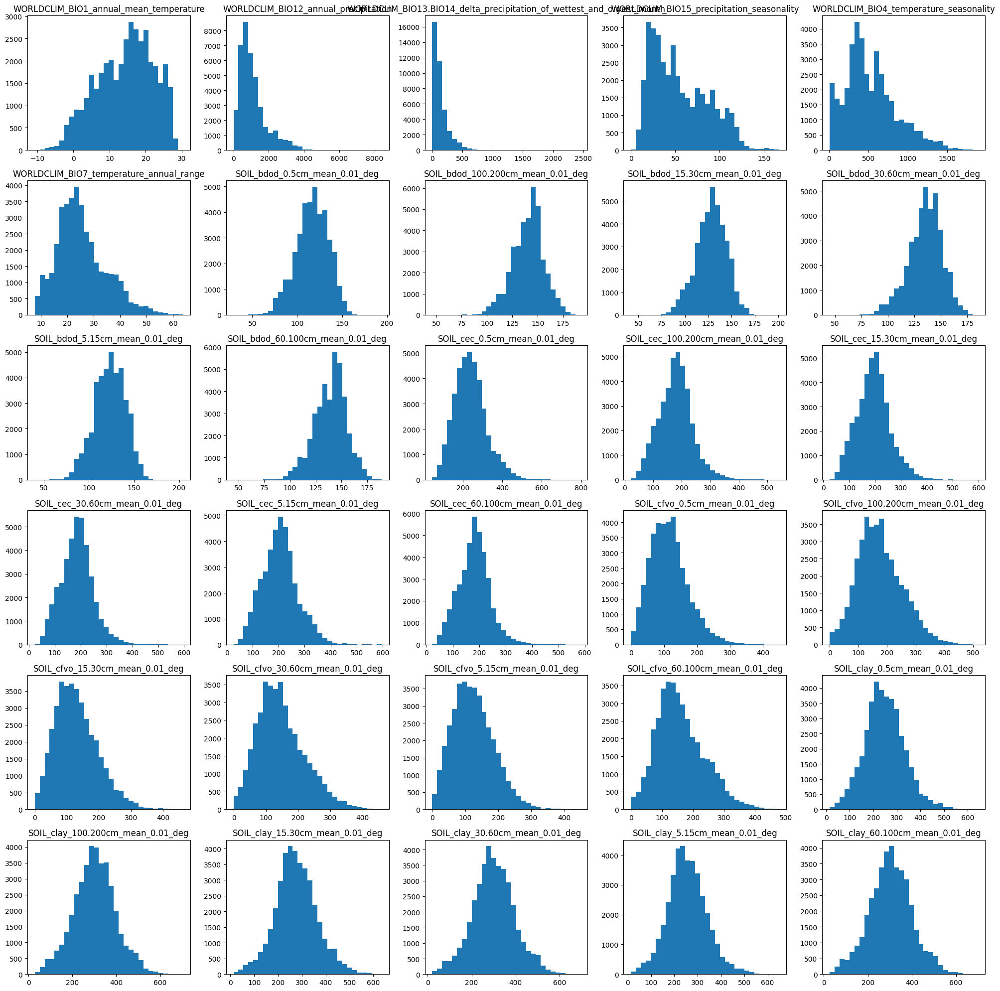

IntSlider(value=0, description='Page', max=5)

In [16]:
# Plot histograms for each numeric column
import matplotlib.pyplot as plt
import ipywidgets as widgets
from IPython.display import display

# Define a function to plot the histograms
def plot_histogram(page):
    fig, axs = plt.subplots(6, 5, figsize=(20, 20))  # Adjust grid layout (rows, columns)
    axs = axs.flatten()  # Flatten to access individual subplots easily

    start = page * 30
    end = min(start + 30, len(numeric_columns))

    for i, col in enumerate(numeric_columns[start:end]):
        if col == 'id':
          continue
        axs[i].hist(X_df[col], bins=30)
        axs[i].set_title(col)

    plt.tight_layout()
    plt.show()

# Create pagination buttons
num_pages = (len(numeric_columns) + 29) // 30
page_slider = widgets.IntSlider(value=0, min=0, max=num_pages - 1, step=1, description='Page')

# Update function to replot when page is changed
def update(change):
    plot_histogram(change['new'])

page_slider.observe(update, names='value')

# Initial plot and display
plot_histogram(0)
display(page_slider)



In [17]:
# Remove rows with outliers based on Z-scores
X_df = X_df[(z_scores < 3).all(axis=1)]

In [18]:
len(X_df)

30836

In [19]:
if 'id' in numeric_columns:
  print('id' in numeric_columns)
  numeric_columns.remove('id')

In [20]:
X_df[numeric_columns].isnull().sum()


,0
WORLDCLIM_BIO1_annual_mean_temperature,0
WORLDCLIM_BIO12_annual_precipitation,0
WORLDCLIM_BIO13.BIO14_delta_precipitation_of_wettest_and_dryest_month,0
WORLDCLIM_BIO15_precipitation_seasonality,0
WORLDCLIM_BIO4_temperature_seasonality,0
...,...
VOD_X_1997_2018_multiyear_mean_m08,0
VOD_X_1997_2018_multiyear_mean_m09,0
VOD_X_1997_2018_multiyear_mean_m10,0
VOD_X_1997_2018_multiyear_mean_m11,0


In [21]:
from sklearn.preprocessing import MinMaxScaler

# Initialize the scaler
min_max_scaler = MinMaxScaler()

# Apply Min-Max scaling
X_normalized = pd.DataFrame(min_max_scaler.fit_transform(X_df[numeric_columns]), columns=numeric_columns)

# Now X_normalized contains values between 0 and 1
X_normalized.head()

,WORLDCLIM_BIO1_annual_mean_temperature,WORLDCLIM_BIO12_annual_precipitation,WORLDCLIM_BIO13.BIO14_delta_precipitation_of_wettest_and_dryest_month,WORLDCLIM_BIO15_precipitation_seasonality,WORLDCLIM_BIO4_temperature_seasonality,WORLDCLIM_BIO7_temperature_annual_range,SOIL_bdod_0.5cm_mean_0.01_deg,SOIL_bdod_100.200cm_mean_0.01_deg,SOIL_bdod_15.30cm_mean_0.01_deg,SOIL_bdod_30.60cm_mean_0.01_deg,...,VOD_X_1997_2018_multiyear_mean_m03,VOD_X_1997_2018_multiyear_mean_m04,VOD_X_1997_2018_multiyear_mean_m05,VOD_X_1997_2018_multiyear_mean_m06,VOD_X_1997_2018_multiyear_mean_m07,VOD_X_1997_2018_multiyear_mean_m08,VOD_X_1997_2018_multiyear_mean_m09,VOD_X_1997_2018_multiyear_mean_m10,VOD_X_1997_2018_multiyear_mean_m11,VOD_X_1997_2018_multiyear_mean_m12
0,0.513658,0.109905,0.115459,0.484330,0.511004,0.560541,0.61,0.593407,0.583333,0.606383,...,0.614845,0.680254,0.688568,0.621336,0.546871,0.521895,0.544178,0.600527,0.602178,0.547956
1,0.649252,0.026485,0.019115,0.256191,0.568280,0.708218,0.60,0.538462,0.604167,0.585106,...,0.361003,0.349480,0.329128,0.279856,0.299021,0.299968,0.310648,0.346273,0.388911,0.418833
2,0.687233,0.432597,0.301184,0.301696,0.248356,0.278851,0.56,0.395604,0.468750,0.457447,...,0.441704,0.430421,0.398410,0.358443,0.387210,0.400695,0.383471,0.439779,0.465680,0.471787
3,0.202267,0.155580,0.093915,0.256256,0.878967,0.837254,0.27,0.560440,0.416667,0.531915,...,0.476393,0.558204,0.600278,0.690603,0.758606,0.764263,0.698273,0.622312,0.615032,0.611374
4,0.508984,0.581723,0.591175,0.498319,0.206339,0.215694,0.37,0.516484,0.416667,0.436170,...,0.459878,0.466272,0.453377,0.432807,0.444551,0.452844,0.445098,0.454983,0.478364,0.475695


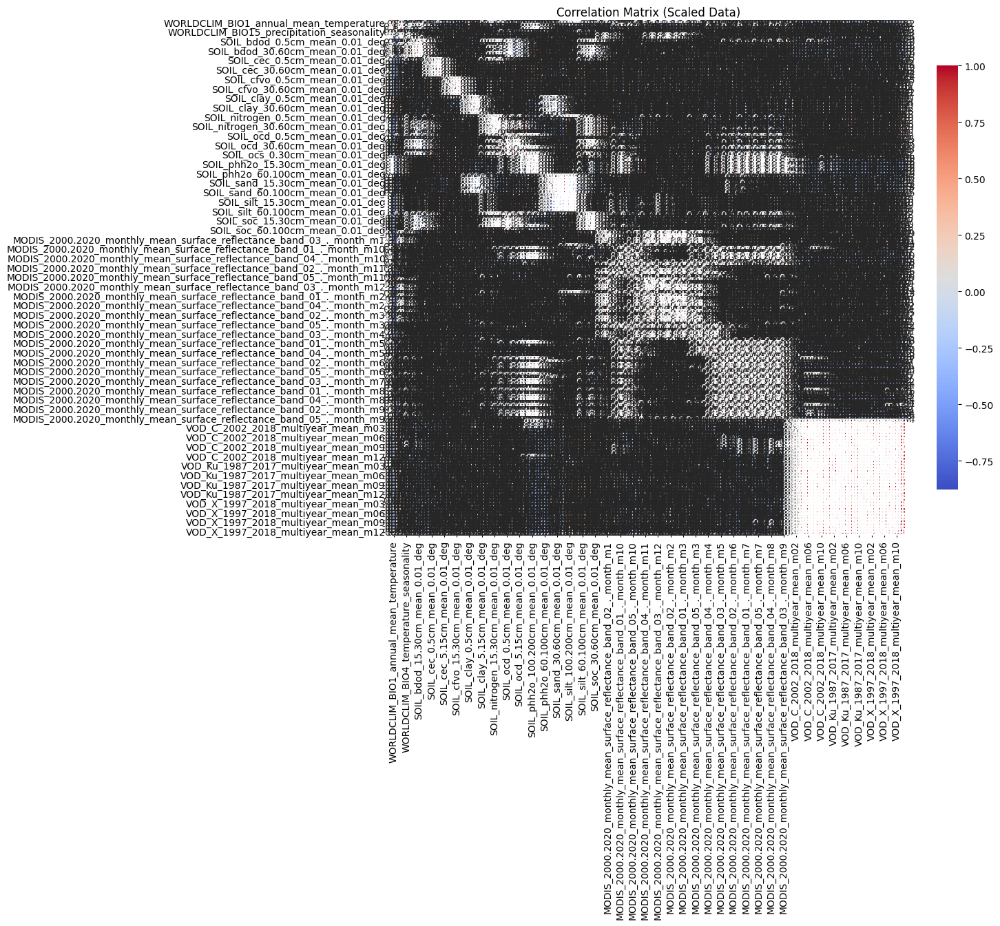

In [22]:
from sklearn.preprocessing import StandardScaler

# Now calculate the correlation matrix on scaled data
corr_matrix = pd.DataFrame(X_normalized, columns=numeric_columns).corr()

# Plotting the correlation matrix
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True, cbar_kws={"shrink": .8})
plt.title('Correlation Matrix (Scaled Data)')
plt.show()


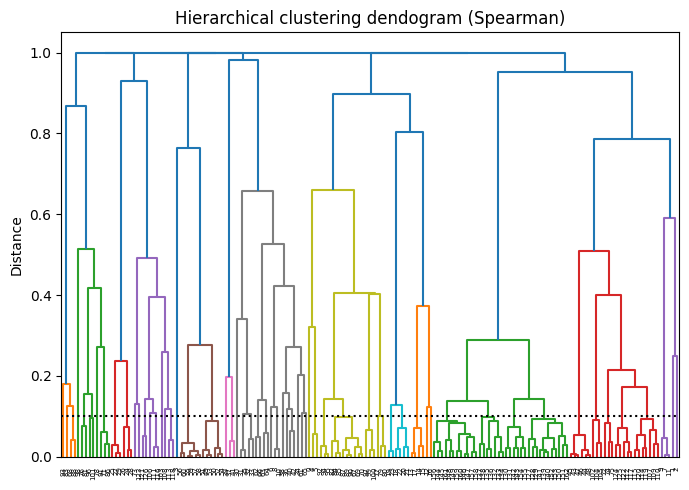

In [23]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.cluster.hierarchy import linkage, dendrogram
from scipy.cluster import hierarchy
from scipy.spatial.distance import squareform

dissimilarity = 1 - abs(corr_matrix.values)

linkage_matrix = hierarchy.linkage(squareform(dissimilarity), method='complete')

# plot the dendogram
fig,ax = plt.subplots(1,1,figsize=(7,5))
dendogram = hierarchy.dendrogram(
    linkage_matrix, ax=ax,
#     labels=corr_matrix.columns.tolist(),
)
# _ = ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
_ = ax.set_ylabel('Distance')
_ = ax.set_title('Hierarchical clustering dendogram (Spearman)')
_ = ax.axhline(0.1, 0, 1, linestyle='dotted', color='k')
_ = ax.grid(False, axis='x')
fig.tight_layout()


In [24]:
threshold = 0.1  # Adjust this threshold as needed
cluster_labels = hierarchy.fcluster(linkage_matrix, threshold, criterion='distance')
n_clusters = np.unique(cluster_labels).shape[0]
print(f'Number of clusters: {n_clusters}\n')

Number of clusters: 60



In [25]:
import json
cluster_features = {}

# show features within each cluster
for label in range(1, n_clusters + 1):
    #print(f'Cluster {label}')

    leaves_in_cluster = cluster_labels == label
    cluster_features[label] = corr_matrix.columns[leaves_in_cluster].tolist()
    #print(cluster_features[label])
    #print()

with open('feature_clusters.json', 'w') as f:
    json.dump(cluster_features, f)

In [26]:
final_features = []
for cols_in_cluster in cluster_features.values():
    final_features.append(cols_in_cluster[0])

X_df = X_df[['id']+final_features]

In [27]:
X_df.describe()

,id,MODIS_2000.2020_monthly_mean_surface_reflectance_band_02_._month_m1,MODIS_2000.2020_monthly_mean_surface_reflectance_band_02_._month_m12,MODIS_2000.2020_monthly_mean_surface_reflectance_band_02_._month_m3,MODIS_2000.2020_monthly_mean_surface_reflectance_band_05_._month_m10,MODIS_2000.2020_monthly_mean_surface_reflectance_band_05_._month_m3,MODIS_2000.2020_monthly_mean_surface_reflectance_band_05_._month_m1,MODIS_2000.2020_monthly_mean_surface_reflectance_band_02_._month_m11,MODIS_2000.2020_monthly_mean_surface_reflectance_band_02_._month_m4,SOIL_clay_100.200cm_mean_0.01_deg,...,VOD_C_2002_2018_multiyear_mean_m04,VOD_C_2002_2018_multiyear_mean_m01,SOIL_phh2o_0.5cm_mean_0.01_deg,MODIS_2000.2020_monthly_mean_surface_reflectance_band_01_._month_m5,MODIS_2000.2020_monthly_mean_surface_reflectance_band_01_._month_m10,MODIS_2000.2020_monthly_mean_surface_reflectance_band_01_._month_m7,MODIS_2000.2020_monthly_mean_surface_reflectance_band_01_._month_m6,SOIL_bdod_100.200cm_mean_0.01_deg,WORLDCLIM_BIO12_annual_precipitation,WORLDCLIM_BIO13.BIO14_delta_precipitation_of_wettest_and_dryest_month
count,3.083600e+04,30836.000000,30836.000000,30836.000000,30836.000000,30836.000000,30836.000000,30836.000000,30836.000000,30836.000000,...,30836.000000,30836.000000,30836.000000,30836.000000,30836.00000,30836.000000,30836.000000,30836.000000,30836.000000,30836.000000
mean,1.738690e+08,2730.410689,2565.736250,2641.898625,2650.736704,2635.865417,2638.650117,2368.455701,2495.710306,308.292677,...,0.360835,0.346234,61.261999,720.209074,750.94607,699.547023,688.937573,142.146776,1015.058567,131.522233
std,3.914696e+07,867.261024,719.990109,701.466571,484.716360,508.701199,591.887530,536.272691,521.543248,87.546934,...,0.115661,0.110879,8.432785,406.477369,396.08650,402.674444,393.436393,14.219304,653.163807,106.486200
min,2.637500e+04,621.000000,569.000000,696.000000,1025.000000,961.000000,650.000000,625.000000,779.000000,30.000000,...,0.011559,0.012848,40.000000,81.000000,94.00000,73.000000,79.000000,95.000000,0.000000,0.000000
25%,1.706114e+08,2111.000000,2071.000000,2156.000000,2348.000000,2275.000000,2227.000000,1993.000000,2145.000000,252.000000,...,0.281482,0.267661,54.000000,443.000000,463.00000,405.000000,410.000000,132.000000,563.294357,54.642857
50%,1.927099e+08,2619.000000,2508.000000,2559.000000,2667.000000,2651.000000,2658.000000,2335.000000,2475.000000,307.000000,...,0.349455,0.333521,61.000000,614.000000,655.00000,593.000000,582.000000,143.000000,849.426208,96.000000
75%,1.953416e+08,3168.250000,2956.000000,3006.000000,2967.000000,3010.000000,3085.000000,2704.000000,2820.000000,365.000000,...,0.436863,0.416911,67.000000,867.000000,932.00000,869.000000,847.000000,151.000000,1272.128815,180.086731
max,1.967628e+08,6856.000000,6202.000000,6155.000000,4296.000000,4369.000000,4541.000000,4528.000000,5014.000000,581.000000,...,0.683625,0.694289,87.000000,3265.000000,2549.00000,2498.000000,2561.000000,186.000000,3407.177734,541.528564


In [28]:
features_columns = [col for col in X_df.columns if col != 'id']

In [29]:
features_columns

['MODIS_2000.2020_monthly_mean_surface_reflectance_band_02_._month_m1',
 'MODIS_2000.2020_monthly_mean_surface_reflectance_band_02_._month_m12',
 'MODIS_2000.2020_monthly_mean_surface_reflectance_band_02_._month_m3',
 'MODIS_2000.2020_monthly_mean_surface_reflectance_band_05_._month_m10',
 'MODIS_2000.2020_monthly_mean_surface_reflectance_band_05_._month_m3',
 'MODIS_2000.2020_monthly_mean_surface_reflectance_band_05_._month_m1',
 'MODIS_2000.2020_monthly_mean_surface_reflectance_band_02_._month_m11',
 'MODIS_2000.2020_monthly_mean_surface_reflectance_band_02_._month_m4',
 'SOIL_clay_100.200cm_mean_0.01_deg',
 'SOIL_clay_0.5cm_mean_0.01_deg',
 'MODIS_2000.2020_monthly_mean_surface_reflectance_band_02_._month_m10',
 'MODIS_2000.2020_monthly_mean_surface_reflectance_band_02_._month_m9',
 'MODIS_2000.2020_monthly_mean_surface_reflectance_band_05_._month_m8',
 'MODIS_2000.2020_monthly_mean_surface_reflectance_band_05_._month_m6',
 'MODIS_2000.2020_monthly_mean_surface_reflectance_band_05_.

In [30]:
df = train_df[['id'] + target_columns]

In [31]:
df.columns

Index(['id', 'X4_mean', 'X11_mean', 'X18_mean', 'X26_mean', 'X50_mean',
       'X3112_mean', 'X4_sd', 'X11_sd', 'X18_sd', 'X26_sd', 'X50_sd',
       'X3112_sd'],
      dtype='object')

In [32]:
data = pd.merge(X_df, df, on='id', how='inner')

In [33]:
len(X_df) == len(data)

True

In [34]:
data.head()

,id,MODIS_2000.2020_monthly_mean_surface_reflectance_band_02_._month_m1,MODIS_2000.2020_monthly_mean_surface_reflectance_band_02_._month_m12,MODIS_2000.2020_monthly_mean_surface_reflectance_band_02_._month_m3,MODIS_2000.2020_monthly_mean_surface_reflectance_band_05_._month_m10,MODIS_2000.2020_monthly_mean_surface_reflectance_band_05_._month_m3,MODIS_2000.2020_monthly_mean_surface_reflectance_band_05_._month_m1,MODIS_2000.2020_monthly_mean_surface_reflectance_band_02_._month_m11,MODIS_2000.2020_monthly_mean_surface_reflectance_band_02_._month_m4,SOIL_clay_100.200cm_mean_0.01_deg,...,X18_mean,X26_mean,X50_mean,X3112_mean,X4_sd,X11_sd,X18_sd,X26_sd,X50_sd,X3112_sd
0,192027691,943,973,1074,1474,1413,1199,1002,1195,224,...,0.117484,1.243779,1.849375,50.216034,0.008921,1.601473,0.025441,0.153608,0.279610,15.045054
1,195542235,920,920,1196,1261,1232,977,1080,1321,174,...,0.389315,0.642940,1.353468,574.098472,0.003102,0.258078,0.000866,0.034630,0.010165,11.004477
2,195728812,3225,3196,3172,3299,3155,3379,3078,3050,341,...,1.083629,0.154200,1.155308,1042.686546,0.011692,2.818356,0.110673,0.011334,0.229224,141.857187
3,195251545,3253,3090,4266,1973,2608,2286,2550,2806,359,...,0.657585,10.919966,2.246226,2386.467180,0.006157,1.128000,0.026996,0.553815,0.107092,87.146899
4,195733955,2321,2337,2404,2200,2192,2008,2359,2679,313,...,1.092759,50.801968,1.085978,363.364702,0.002750,0.352804,0.041009,7.854885,0.009494,14.671018


In [65]:
import os
import pandas as pd
from PIL import Image
from torch.utils.data import Dataset
from sklearn.preprocessing import StandardScaler

class PlantDataset(Dataset):
    def __init__(self, data, features_columns, target_columns, img_dir, transform=None, scaler=None, test_mode=False):
        self.data = data
        self.img_dir = img_dir
        self.transform = transform
        self.test_mode = test_mode

        # Columns containing features
        self.features_columns = features_columns

        if not test_mode:  # If training/validation data
            self.target_columns = target_columns

        # Apply scaling to ancillary data columns
        self.scaler = StandardScaler()
        self.data[self.features_columns] = self.scaler.fit_transform(self.data[self.features_columns])


    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        img_id = int(self.data.iloc[idx]['id'])
        img_path = os.path.join(self.img_dir, f'{img_id}.jpeg')
        image = Image.open(img_path)

        if self.transform:
            image = self.transform(image)

        # Get ancillary data
        ancillary_data = torch.tensor(self.data.iloc[idx][self.features_columns].values, dtype=torch.float32)

        if self.test_mode:
            return image, ancillary_data  # No target in test mode

        # Get target for training/validation data
        target = torch.tensor(self.data.iloc[idx][self.target_columns].values, dtype=torch.float32)
        return image, ancillary_data, target


In [36]:
from sklearn.preprocessing import StandardScaler
import torchvision.transforms as T

# Define image transformations
transform = T.Compose([
    T.RandomHorizontalFlip(),
    T.RandomVerticalFlip(),
    T.RandomRotation(degrees=15),
    T.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    T.ToTensor(),
])


# Load train dataset
data_folder='/content'
train_dataset = PlantDataset(data=data,features_columns=features_columns, target_columns=target_columns, img_dir=os.path.join(data_folder,'train_images'), transform=transform)

# Split the dataset
train_size = int(0.8 * len(train_dataset))
val_size = len(train_dataset) - train_size
train_dataset, val_dataset = torch.utils.data.random_split(train_dataset, [train_size, val_size])

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)


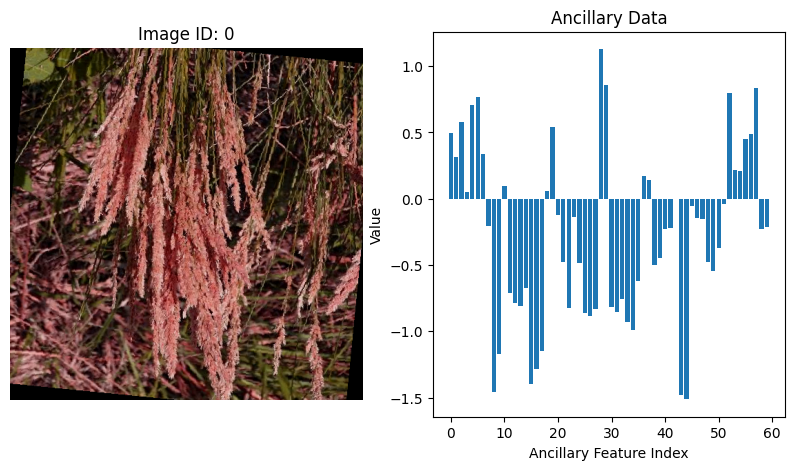

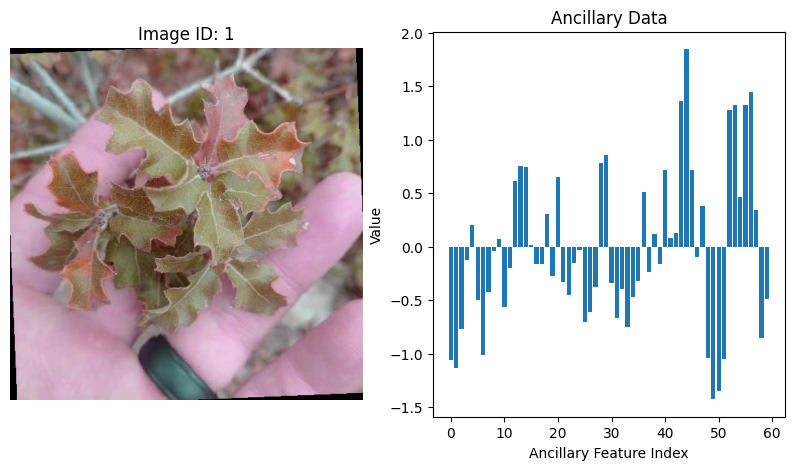

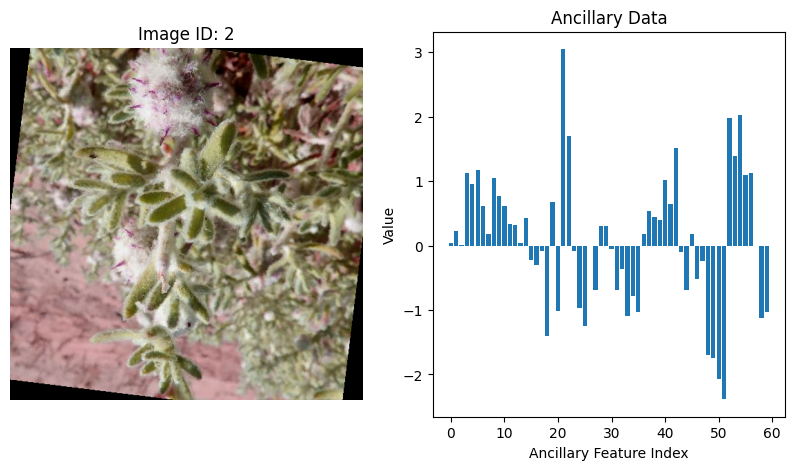

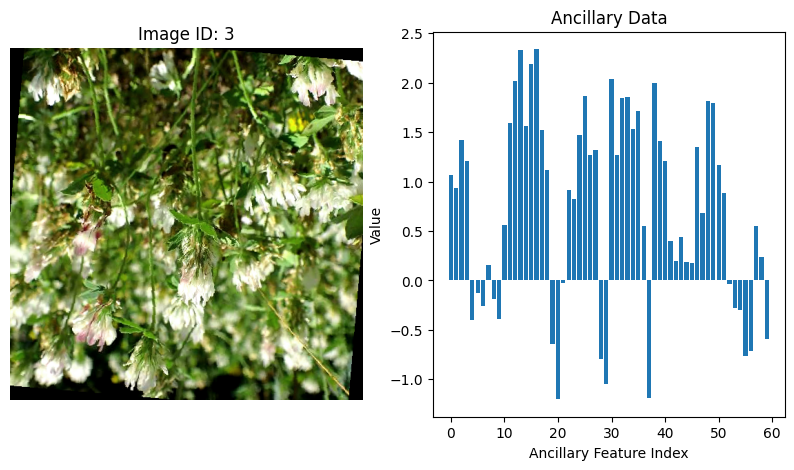

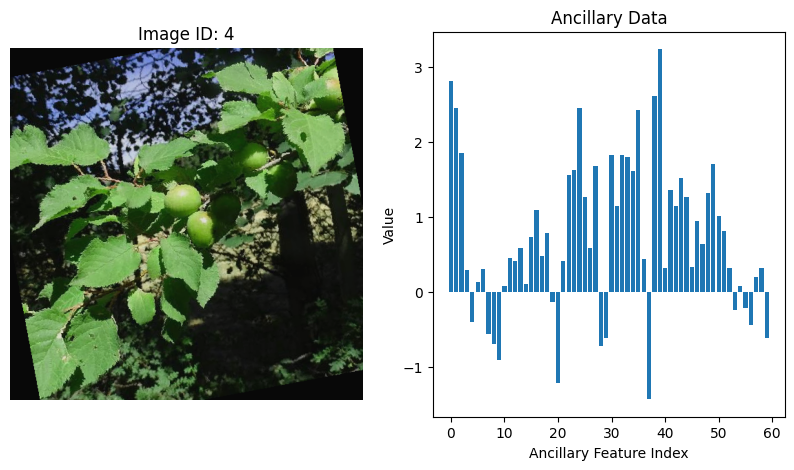

In [37]:
import matplotlib.pyplot as plt
import torchvision.transforms as transforms

def show_images_with_ancillary(data_loader, num_images=5):
    """Visualize a few images along with their ancillary data."""

    transform = transforms.ToPILImage()  # Convert Tensor image back to PIL

    # Loop through the dataset and visualize a few samples
    for i, (images, ancillary_data, targets) in enumerate(data_loader):
        if i >= num_images:  # Only show specified number of images
            break

        fig, ax = plt.subplots(1, 2, figsize=(10, 5))

        # Visualize the image
        image = images[0].cpu()  # Get the first image in the batch and move to CPU
        image = transform(image)  # Convert tensor to PIL Image for visualization
        ax[0].imshow(image)
        ax[0].axis('off')  # Turn off axis
        ax[0].set_title(f"Image ID: {i}")

        # Plot ancillary data as a bar chart
        ancillary_data = ancillary_data[0].cpu().numpy()  # Get ancillary data for first image in batch
        ax[1].bar(range(len(ancillary_data)), ancillary_data)
        ax[1].set_title("Ancillary Data")
        ax[1].set_xlabel("Ancillary Feature Index")
        ax[1].set_ylabel("Value")

        plt.show()

# Use the function with your data loader
show_images_with_ancillary(train_loader, num_images=5)


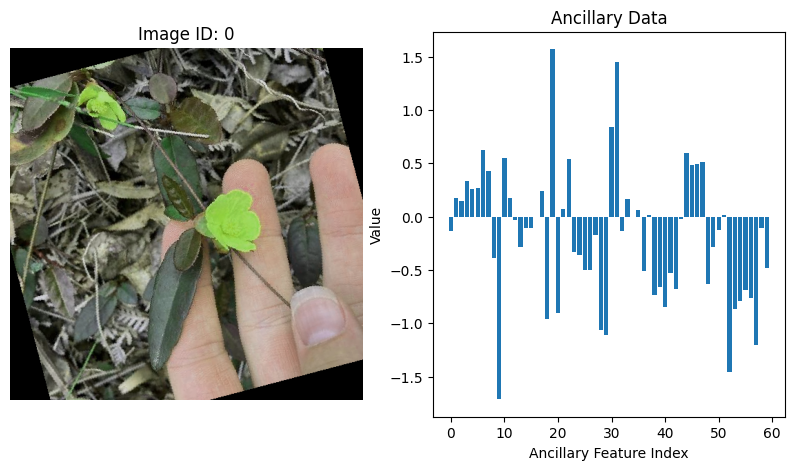

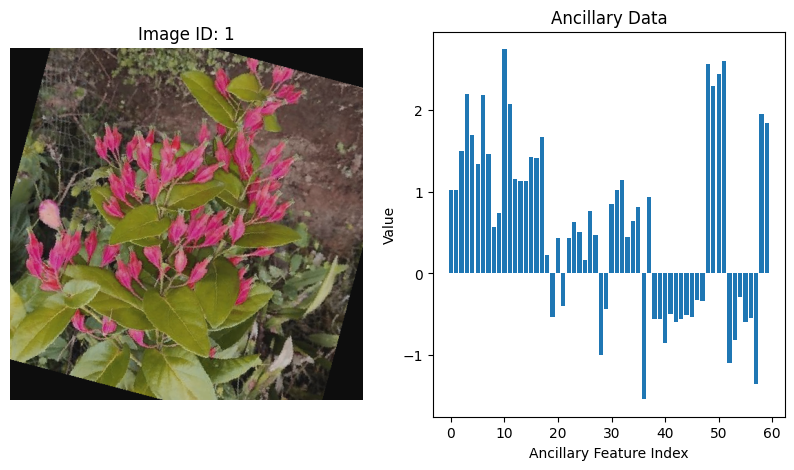

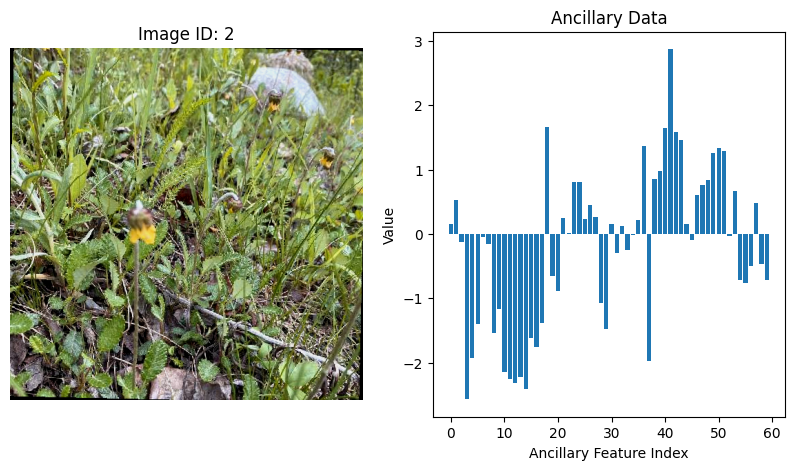

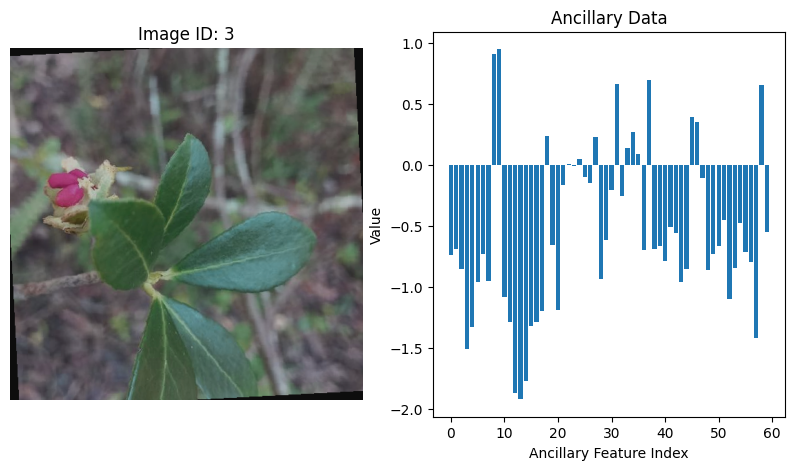

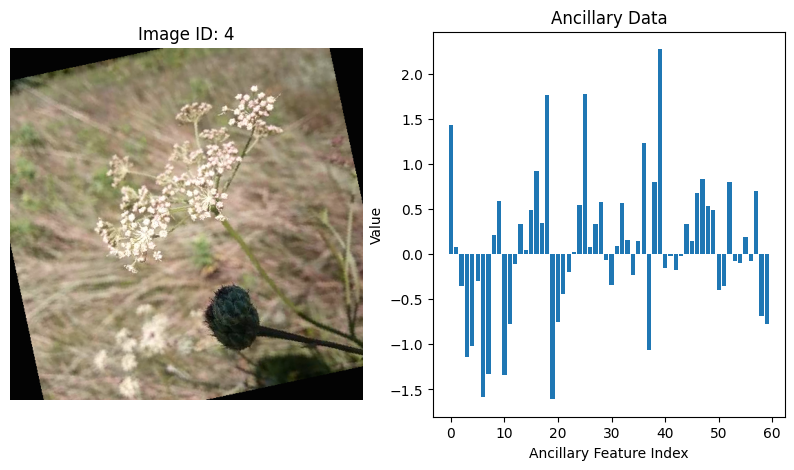

In [38]:
# Use the function with your data loader
show_images_with_ancillary(val_loader, num_images=5)

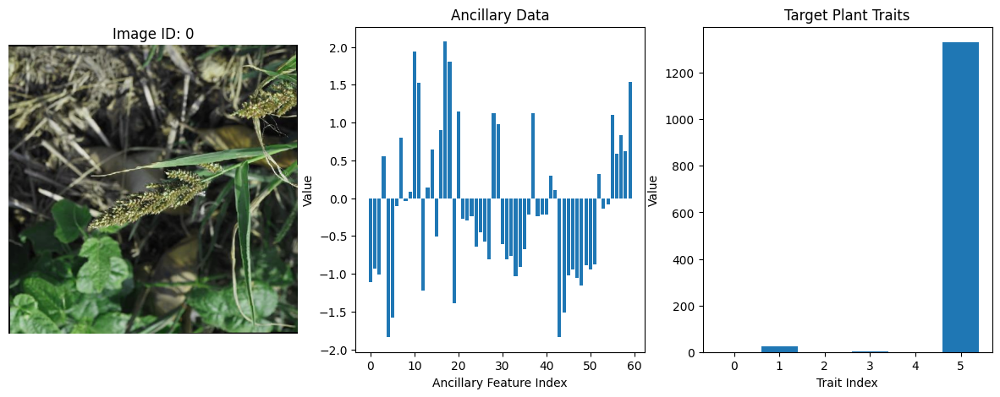

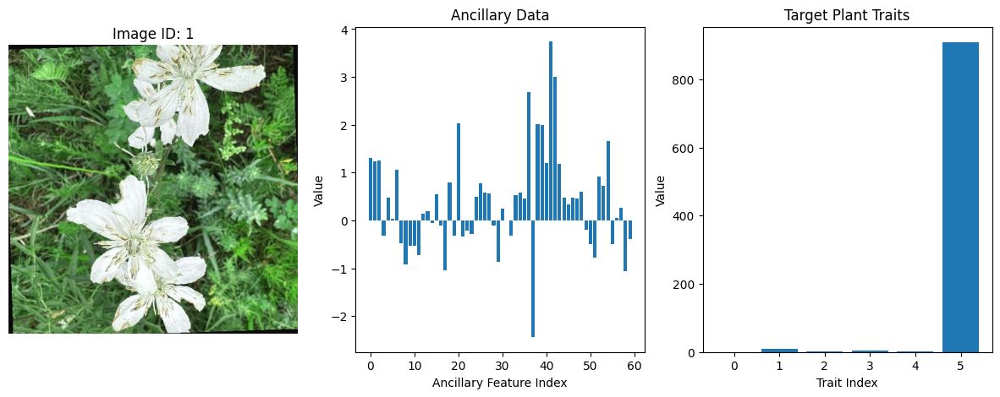

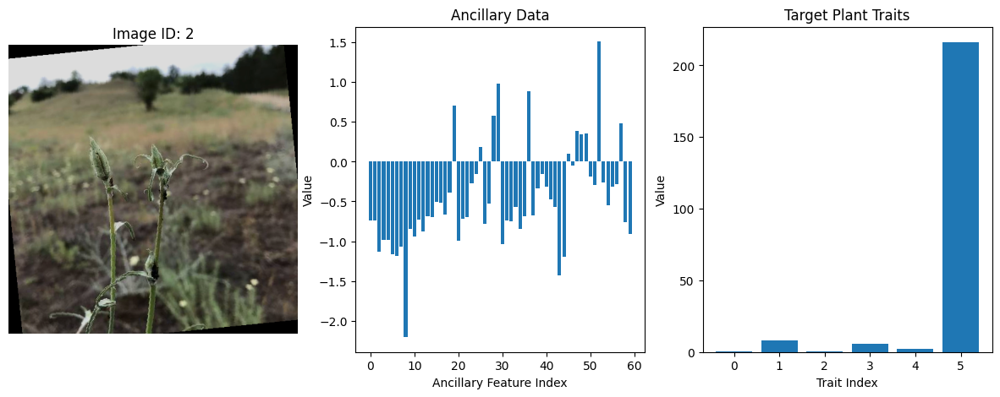

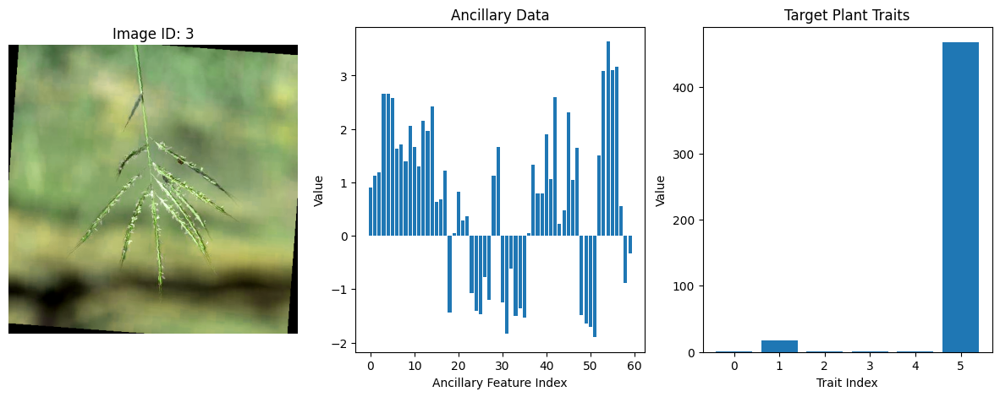

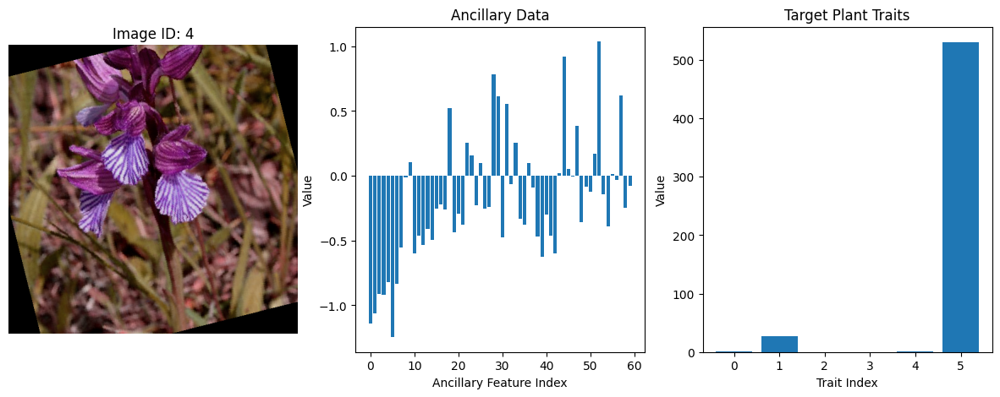

In [39]:
import matplotlib.pyplot as plt
import torchvision.transforms as transforms

def show_images_with_ancillary_and_target(data_loader, num_images=5):
    """Visualize images with their ancillary data and target plant traits."""

    transform = transforms.ToPILImage()  # Convert Tensor image back to PIL

    for i, (images, ancillary_data, targets) in enumerate(data_loader):
        if i >= num_images:  # Only show specified number of images
            break

        fig, axs = plt.subplots(1, 3, figsize=(15, 5))

        # Visualize the image
        image = images[0].cpu()  # Get the first image in the batch and move to CPU
        image = transform(image)  # Convert tensor to PIL Image for visualization
        axs[0].imshow(image)
        axs[0].axis('off')  # Turn off axis
        axs[0].set_title(f"Image ID: {i}")

        # Plot ancillary data as a bar chart
        ancillary_data = ancillary_data[0].cpu().numpy()  # Get ancillary data for the first image
        axs[1].bar(range(len(ancillary_data)), ancillary_data)
        axs[1].set_title("Ancillary Data")
        axs[1].set_xlabel("Ancillary Feature Index")
        axs[1].set_ylabel("Value")

        # Plot target data (trait predictions) as a bar chart
        target_data = targets[0].cpu().numpy()  # Get target data for the first image
        axs[2].bar(range(len(target_data)), target_data)
        axs[2].set_title("Target Plant Traits")
        axs[2].set_xlabel("Trait Index")
        axs[2].set_ylabel("Value")

        plt.show()

# Use the function with your data loader
show_images_with_ancillary_and_target(train_loader, num_images=5)


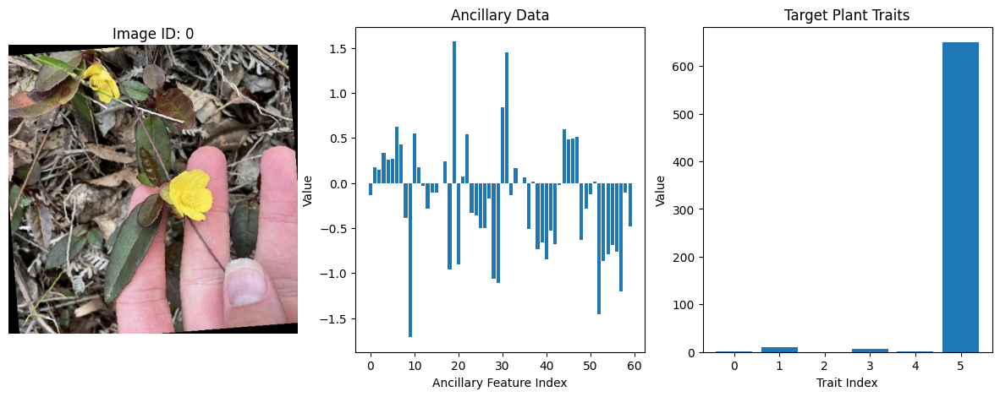

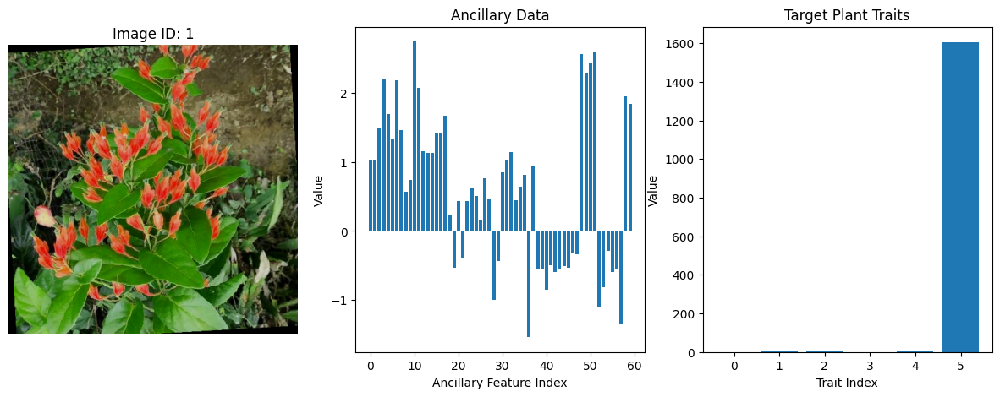

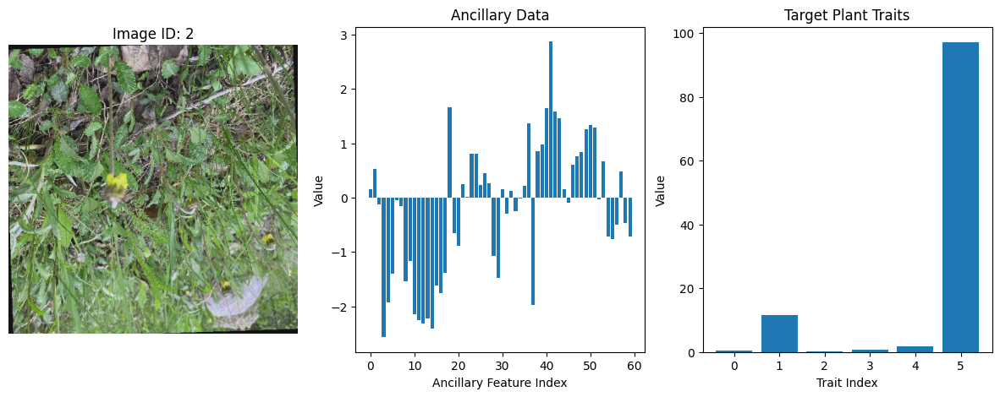

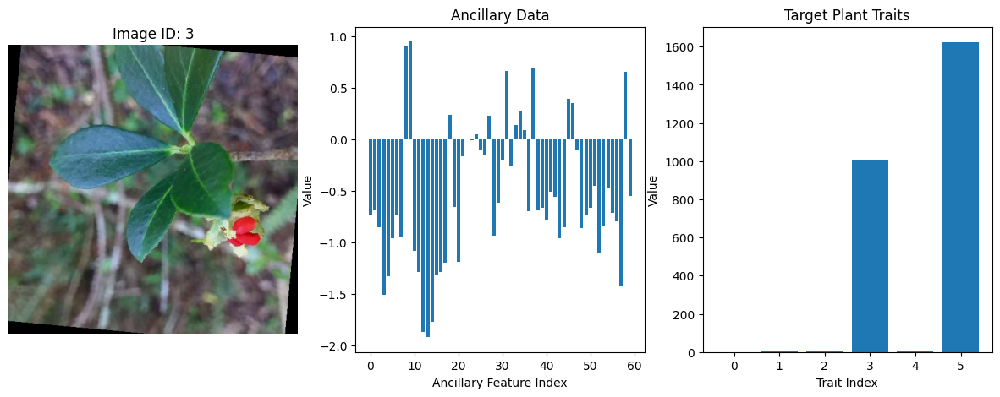

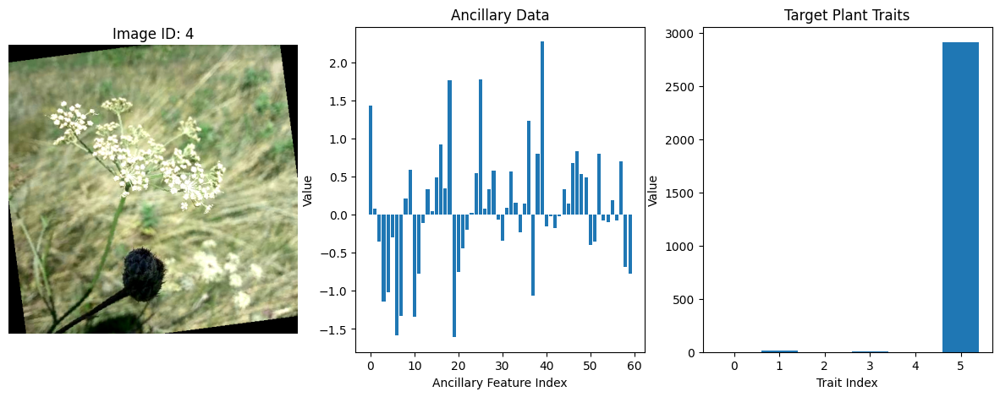

In [40]:
show_images_with_ancillary_and_target(val_loader, num_images=5)


In [41]:
class PlantTraitsModel(nn.Module):
    def __init__(self, num_ancillary_features, num_targets):
        super(PlantTraitsModel, self).__init__()
        # Pretrained ResNet50 for image feature extraction
        self.resnet = models.resnet50(pretrained=True)
        self.resnet.fc = nn.Identity()  # Remove the last fully connected layer

        # Fully connected layers to process ancillary data
        self.fc1 = nn.Linear(2048 + num_ancillary_features, 512)
        self.fc2 = nn.Linear(512, num_targets)

    def forward(self, image, ancillary_data):
        # Extract image features
        img_features = self.resnet(image)

        # Concatenate image features with ancillary data
        combined = torch.cat((img_features, ancillary_data), dim=1)

        # Forward pass through fully connected layers
        x = torch.relu(self.fc1(combined))
        x = self.fc2(x)
        return x


In [42]:
import torch
import torch.nn as nn

class R2Loss(nn.Module):
    def __init__(self):
        super(R2Loss, self).__init__()

    def forward(self, y_pred, y_true):
        ss_res = torch.sum((y_true - y_pred) ** 2)
        ss_tot = torch.sum((y_true - torch.mean(y_true)) ** 2)
        r2 = 1 - ss_res / (ss_tot + 1e-6)  # Add small value to avoid division by zero
        return 1 - r2  # We return 1 - r2 as we want to minimize this value (hence maximizing R²)


In [43]:
import torch
import torch.optim as optim
from torch.optim.lr_scheduler import StepLR

# Define device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Initialize model, optimizer, criterion, and scheduler
num_ancillary_features = len(train_dataset.dataset.features_columns)
num_targets = len(train_dataset.dataset.target_columns)
model = PlantTraitsModel(num_ancillary_features=num_ancillary_features, num_targets=num_targets).to(device)

criterion = R2Loss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)

# Learning rate scheduler (optional)
scheduler = StepLR(optimizer, step_size=20, gamma=0.1)  # Decrease LR by 0.1 every 20 epochs

# Function to save the model, optimizer, and scheduler states
def save_checkpoint(epoch, model, optimizer, scheduler, loss, filename='best_model_checkpoint.pt'):
    state = {
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'scheduler_state_dict': scheduler.state_dict(),
        'loss': loss,
    }
    torch.save(state, filename)

# Function to load the model, optimizer, and scheduler states
def load_checkpoint(filename, model, optimizer, scheduler):
    checkpoint = torch.load(filename)
    model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    scheduler.load_state_dict(checkpoint['scheduler_state_dict'])
    epoch = checkpoint['epoch']
    loss = checkpoint['loss']
    return epoch, loss

# Training loop with checkpoint saving
num_epochs = 30
best_val_loss = float('inf')  # To keep track of the best model
dir = '/content/drive/MyDrive/Model/PlantTraits'
os.makedirs(dir, exist_ok=True)
checkpoint_path = os.path.join(dir,'best_model_checkpoint.pt')
# Loading the best model
# Load the best model if it exists
if os.path.exists(checkpoint_path):
    start_epoch, best_val_loss = load_checkpoint(checkpoint_path, model, optimizer, scheduler)
    print(f'Loaded checkpoint from epoch {start_epoch} with validation loss: {best_val_loss:.4f}')
else:
    start_epoch = 0  # If no checkpoint is found, start from the first epoch

# Training loop with checkpoint saving
for epoch in range(start_epoch, num_epochs):  # Start from the loaded epoch
    model.train()
    train_loss = 0.0

    for images, ancillary_data, targets in train_loader:
        images, ancillary_data, targets = images.to(device), ancillary_data.to(device), targets.to(device)

        # Forward pass
        outputs = model(images, ancillary_data)
        loss = criterion(outputs, targets)

        # Backward pass and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_loss += loss.item() * images.size(0)

    train_loss /= len(train_loader.dataset)

    # Validation phase
    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for images, ancillary_data, targets in val_loader:
            images, ancillary_data, targets = images.to(device), ancillary_data.to(device), targets.to(device)
            outputs = model(images, ancillary_data)
            loss = criterion(outputs, targets)
            val_loss += loss.item() * images.size(0)

    val_loss /= len(val_loader.dataset)

    # Save model if it has the best validation loss
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        save_checkpoint(epoch, model, optimizer, scheduler, val_loss, filename=checkpoint_path)

    # Step the learning rate scheduler
    scheduler.step()

    print(f'Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss:.4f}, Validation Loss: {val_loss:.4f}')


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:01<00:00, 53.3MB/s]
<ipython-input-43-85c9f8d7ac1c>:32: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is pos

Loaded checkpoint from epoch 11 with validation loss: 0.6603
Epoch 12/30, Train Loss: 0.6483, Validation Loss: 0.6441
Epoch 13/30, Train Loss: 0.6433, Validation Loss: 0.6471
Epoch 14/30, Train Loss: 0.6455, Validation Loss: 0.6461
Epoch 15/30, Train Loss: 0.6413, Validation Loss: 0.6387
Epoch 16/30, Train Loss: 0.6400, Validation Loss: 0.6504
Epoch 17/30, Train Loss: 0.6326, Validation Loss: 0.6789
Epoch 18/30, Train Loss: 0.6314, Validation Loss: 0.6462
Epoch 19/30, Train Loss: 0.6256, Validation Loss: 0.6454
Epoch 20/30, Train Loss: 0.6314, Validation Loss: 0.6619
Epoch 21/30, Train Loss: 0.6094, Validation Loss: 0.6354
Epoch 22/30, Train Loss: 0.6000, Validation Loss: 0.6370
Epoch 23/30, Train Loss: 0.6050, Validation Loss: 0.6381
Epoch 24/30, Train Loss: 0.6004, Validation Loss: 0.6310
Epoch 25/30, Train Loss: 0.5980, Validation Loss: 0.6388
Epoch 26/30, Train Loss: 0.5934, Validation Loss: 0.6371
Epoch 27/30, Train Loss: 0.5895, Validation Loss: 0.6378
Epoch 28/30, Train Loss: 0.

In [44]:
torch.save(model.state_dict(), os.path.join(dir,'plant_traits_model.pth'))

In [56]:
import pandas as pd

# Load train and test CSVs
test_data = pd.read_csv('test.csv')
test_df = test_data[["id"]+features_columns]


In [58]:
test_dataset = PlantDataset(test_df,  features_columns, target_columns, img_dir='test_images', transform=transform, test_mode=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

<ipython-input-57-e0a1bdc435b1>:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.data[self.features_columns] = self.scaler.fit_transform(self.data[self.features_columns])


In [59]:
model = PlantTraitsModel(num_ancillary_features=num_ancillary_features, num_targets=num_targets).to(device)
model.load_state_dict(torch.load(os.path.join(dir,'plant_traits_model.pth')))

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
<ipython-input-59-b4b8392abca9>:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more detail

<All keys matched successfully>

In [60]:
import torch

# Assuming test_loader is defined and contains the data you want to make predictions on
model.eval()  # Set the model to evaluation mode

predictions = []

with torch.no_grad():  # Disable gradient calculation for prediction
    for images, ancillary_data in test_loader:
        images, ancillary_data = images.to(device), ancillary_data.to(device)

        # Forward pass: Get predictions
        outputs = model(images, ancillary_data)

        # Append predictions and true targets
        predictions.append(outputs.cpu())  # Store outputs, move to CPU if using GPU


In [63]:
predictions = torch.cat(predictions, dim=0).numpy()

In [69]:
submission = pd.DataFrame(
    predictions,
    columns=target_columns,
    index=test_df['id']
).reset_index()


submission.to_csv('submission.csv', index=False)